# Saving Castaway Bob
## Setting the Scene
Bob is enjoying his time on a new cruise with his family. Among the cruise attractions is a massive waterslide.

While sliding down the slide Bob is met by catastrophe. Due to a part failure the structure partially collapses as Bob slides down, sending him careening into the sea.

Unfortunately Bob is now lost at sea. He was fortunate enough to be wearing a life jacket since he can't swim so he is floating somewhere in the Ocean.

Our mission is to save Bob.

## What info do we have
Thankfully Bob's phone has an SOS mode which broadcasts his GPS location every minute. Unfortunately this GPS signal is very weak and is only accurate to a 50m radius. We need a narrower range to be able to send out a rescue team.

Heres what we have thus far mathematically.
We can observe the variable $Y$, which is the output of the GPS

$
\vec{Y}[n] \thicksim \mathcal{N}(\vec{x}[n], \sigma_p \mathbb{I}_2)
$


We also know that bob will have little effect on the bulk ocean dynamics, and will flow as a neutrally boyant particle embedded in the velocity field subject to random forces from fish and other unmodelable sources.

For the purposes of this rescue mission we will neglect deep-water effects and treat the flowfield as 2d

To make the math work out we'll express this challenge as a linear-state-space model. Which just means we will have a locally linear update rule governing a vector timeseries.

Bob floats along the $u$ field as follows

To start out we define $\vec{x} = \begin{bmatrix} x \\ y \\ v_x \\ v_y \end{bmatrix}$

$\vec{x}[n+1] = A \vec{x}[n] + \begin{bmatrix} 0 \\ 0 \\ F_x \\ F_y \end{bmatrix}$

With gaussian random forces $F_x, F_y \thicksim \mathcal{N}(0, \sigma_F \mathbb{I_2})$

$A$ is the matrix that integrates our velocity state into our position state and with a weak damping $\alpha < 1$ on velocity for numeric stability

$\begin{bmatrix}
1 & 0  & dt & 0 \\
0 & 1 & 0 & dt \\
0 & 0 & \alpha & 0 \\
0 & 0 & 0 & \alpha \\
\end{bmatrix}$

We can then only observe position, which we express as the following equation.

$\vec{y}[n] = \vec{x}[n] + \vec{n_y}$

Where $n \thicksim \mathcal{N}(0, \sigma_y \mathbb{I}_2)$ is our "observation noise", and $F_b$ is our "process noise"

## Enough chat, time for pretty GIFs

In [1]:
using LinearAlgebra, Statistics, WaterLily, CUDA, StaticArrays, Plots#, ProgressMeter
gr()
theme(:dark)

In [2]:
XBOUND = 32
YBOUND = 32
DAMPING = 0.8

0.8

In [3]:
# Numerically integrate velocity into position and brownian force into velocity

function step_bob(particle_state, flowvel, flowforce, sigma_F, dt; lims = (XBOUND, YBOUND), damping = DAMPING, mass = 0.1)
    new_state = zeros(4)
    # VELOCITY INTEGRATION
    new_state[1] = particle_state[1] + particle_state[3]*dt
    new_state[2] = particle_state[2] + particle_state[4]*dt

    # FORCES
    new_state[3] = flowvel[1]+damping*particle_state[3] + (flowforce[1] + CUDA.randn()*sigma_F)*dt/mass # flowforce, brownianforce
    new_state[4] = flowvel[2]+damping*particle_state[4] + (flowforce[2] + CUDA.randn()*sigma_F)*dt/mass

    #BOUNDING
    if new_state[1] > XBOUND || new_state[1] < 0
        new_state[1] = new_state[1] > XBOUND ? XBOUND-0.001 : 0.001
        new_state[3] = -new_state[3]
    end
    if new_state[2] > YBOUND || new_state[2] < 0
        new_state[2] = new_state[2] > YBOUND ? YBOUND-0.001 : 0.001
        new_state[4] = -new_state[4]
    end
    new_state
end
# Add observation noise
observe(particle_state, sigma_y) = [particle_state[1]+CUDA.randn()*sigma_y; particle_state[2]+CUDA.randn()*sigma_y]

observe (generic function with 1 method)

In [ ]:
NSTEPS = 100
path = []
obsv_path = []
let
Bob = CuArray([XBOUND/2; YBOUND/2; -5; -5])
global anim = @animate  for i in 1:NSTEPS
    Bob = step_bob(Bob, CUDA.zeros(2), CUDA.zeros(2), 100, 0.1, mass=10)

    gps_reading = observe(Bob, 5)
    push!(path, Bob[1:2])
    push!(obsv_path, gps_reading)

    # plot(stack(obsv_path)[1, :],stack(obsv_path)[2, :], color=:yellow, label="Observed Path", xlim=(-1, 1), ylim=(-1, 1))
    scatter([gps_reading[1]], [gps_reading[2]], title="Bob's Voyage",
                                                size=(1600, 900),
                                                color=:yellow, markershape=:xcross,
                                                label="GPS Reading",
                                                xlim=(0, XBOUND), ylim=(0, YBOUND),
                                                legendloc=:topleft)

    plot!(stack(path)[1, max(1,end-10):end],stack(path)[2, max(1,end-10):end], color=:blue, label="True Path")
    scatter!([Bob[1]], [Bob[2]], color=:blue, label="Bob")
end
end
gif(anim, fps=15)

## Ocean Dynamics
Before generating our pictures its worth considering Bob's locale: the Ocean.

Because Bob is lucky enough to have a life jacket of neutral boyancy, we will model Bob as an ideal lagrangian particle.
Which is to say that the contribution of outside velocity fields is greater than any force on him.

Another important factor is that we are considering a high-reynolds number flow because the lengthscale over which bob is moving is large while hes moving comparitively slowly.

We implement this with WaterLily.jl a Julia library for fluid simulation.

WaterLily.jl solves the unsteady incompressible 2D or 3D Navier-Stokes equations on a Cartesian grid. The pressure Poisson equation is solved with a geometric multigrid method.

In our case we can use the shallow-water approximation and assume the flow regime is roughly 2d.

A common approach employed in WaterLily.jl is to first solve the momentum equations, and have some numerical error, then correct by solving the poisson pressure equation.

Starting from the incrompressibility condition

$\nabla \cdot \vec{u} = 0$

and the momentum equation

$ \partial_t u + u \cdot \nabla u = -\frac{1}{\rho}\nabla p + \eta \nabla^2 u$

We can decouple the pressure and velocity by taking the divergence of the momentum equation to get

$\nabla^2p = -\rho \nabla \cdot (\partial_t u + u \cdot \nabla u) + \eta \nabla^2 u$

In [5]:
# include("FluidPlot.jl")
meshgrid(x, y) = (repeat(x, outer=length(y)), repeat(y, inner=length(x)))

meshgrid (generic function with 1 method)

In [6]:
function makesim(L1, L2; Re=10000, velscale = 0.7, randvelscale=0.1, mem=CuArray,U=1)
    # Define simulation size, geometry dimensions, viscosity
    # Define vortex size, velocity, viscosity
    ν = U*max(L1, L2)/Re
    # Taylor-Green-Vortex initial velocity field
    function uλ(i,xy)

        x,y = xy #@. 5*(xy-mean(xy))*π/max(L1, L2)                # scaled coordinates
        i==1 && return x > L1/2 ? -2 : 2;#velscale*(sin(x/L1)*cos(y/L2) + randn()*randvelscale)#*cos(z) # u_x
        i==2 && return y > L2/2 ? -2 : 2;#velscale*(-cos(x/L1)*sin(y/L2) + randn()*randvelscale)#*cos(z) # u_y
        return 0.0
    end
    # Initialize simulation
    T = Float32
    perdir=(1,2)
    return Simulation((L1, L2), (U, 0), max(L1, L2); U, uλ, ν, T, mem, perdir)
end

makesim (generic function with 1 method)

[ Info: Saved animation to c:\Users\TheoA\Documents\MIT\JUNJAUNT\18.354 Continuum Dynamics\final project\tmp.gif


Plots.AnimatedGif("c:\\Users\\TheoA\\Documents\\MIT\\JUNJAUNT\\18.354 Continuum Dynamics\\final project\\tmp.gif")
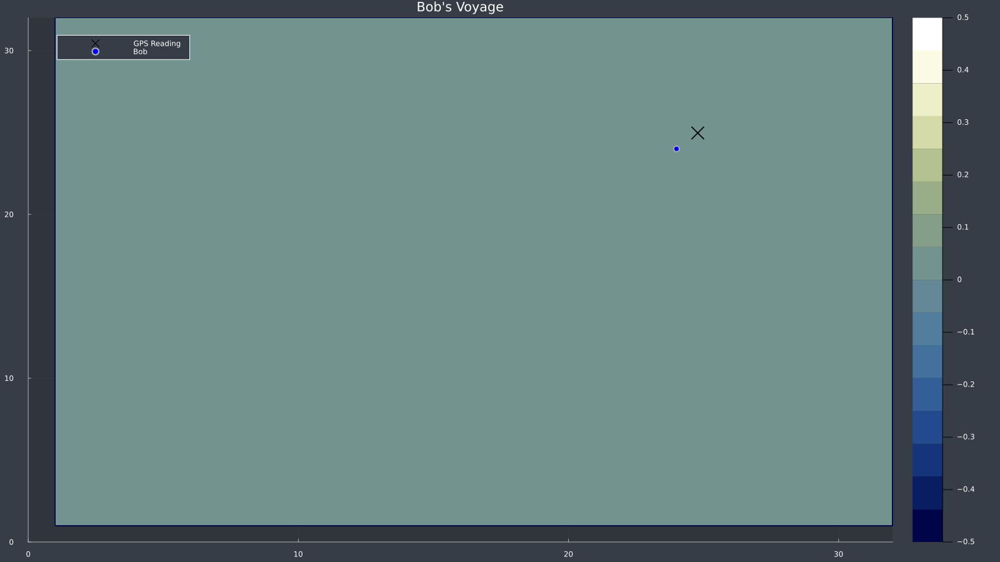

In [18]:
sim = makesim(XBOUND, YBOUND);
# intialize
t₀ = sim_time(sim)
duration = 5
tstep = 0.1
PATHTRAIL = 3
let
Bob = CuArray([3*XBOUND/4; 3*YBOUND/4; 0; 0])
global anim = @animate for tᵢ in range(t₀,t₀+duration;step=tstep)
    # SIMULATION STEP
    sim_step!(sim,tᵢ,remeasure=true)
    Bobidxx = Int(trunc(Bob[1]/XBOUND)*size(sim.flow.p)[1])+1
    Bobidxy = Int(trunc(Bob[2]/YBOUND)*size(sim.flow.p)[2])+1
    gradpx = (sim.flow.p[mod(Bobidxx + 1, size(sim.flow.p)[1]), Bobidxy] - sim.flow.p[Bobidxx, Bobidxy])/2
    gradpy = (sim.flow.p[Bobidxx, mod(Bobidxy + 1, size(sim.flow.p)[1])] - sim.flow.p[Bobidxx, Bobidxy])/2
    Bobflowforce = 5*CuArray([gradpx; gradpy])
    Bobflowvel = CuArray(sim.flow.u[Bobidxx, Bobidxy, :])
    Bob = step_bob(Bob, Bobflowvel, Bobflowforce, 10, tstep, mass=0.5) # BOB is forced along the pressure gradient and impacted by ambient velocity

    # OUR GPS READING
    gps_reading = observe(Bob, 5)
    push!(path, Bob[1:2])
    push!(obsv_path, gps_reading)

    # GENERATE GRAPHICS
    # @inside sim.flow.σ[I] = WaterLily.curl(3,I,sim.flow.u)*sim.L/sim.U
    # flood(sim.flow.σ,clims=(-10,10),shift=(-0.5,-0.5))
    xgrid, ygrid = meshgrid(1:XBOUND, 1:YBOUND)
    # print(size(sim.flow.p[2:end-1, 2:end-1]), size(1:XBOUND), size(1:YBOUND))
    contourf(   sim.flow.p',
                title="Bob's Voyage",
                size=(1600, 900),
                c=:davos, clims=(-0.5, 0.5),
                label="Pressure Field")
    # quiver!(xgrid, ygrid, quiver = (sim.flow.u[2:end-1, 2:end-1, 1], sim.flow.u[2:end-1, 2:end-1, 2]), color=:grey)
    scatter!([gps_reading[1]], [gps_reading[2]],  color=:black, markersize=10, markershape=:xcross, label="GPS Reading", xlim=(0, XBOUND), ylim=(0, YBOUND), legend=:topleft)
    scatter!([Bob[1]], [Bob[2]], color=:blue, markersize=5, label="Bob")
end
end
gif(anim, fps=15)

## Ok we now have a good representation of Bob lost at sea, lets try some different estimators to see how they operate

### Fixed-Lag Mean Estimator
Lets start with the simplest possible estimator, just averaging the last 3 gps signals. How well does this work?

[ Info: Saved animation to c:\Users\TheoA\Documents\MIT\JUNJAUNT\18.354 Continuum Dynamics\final project\tmp.gif


Plots.AnimatedGif("c:\\Users\\TheoA\\Documents\\MIT\\JUNJAUNT\\18.354 Continuum Dynamics\\final project\\tmp.gif")
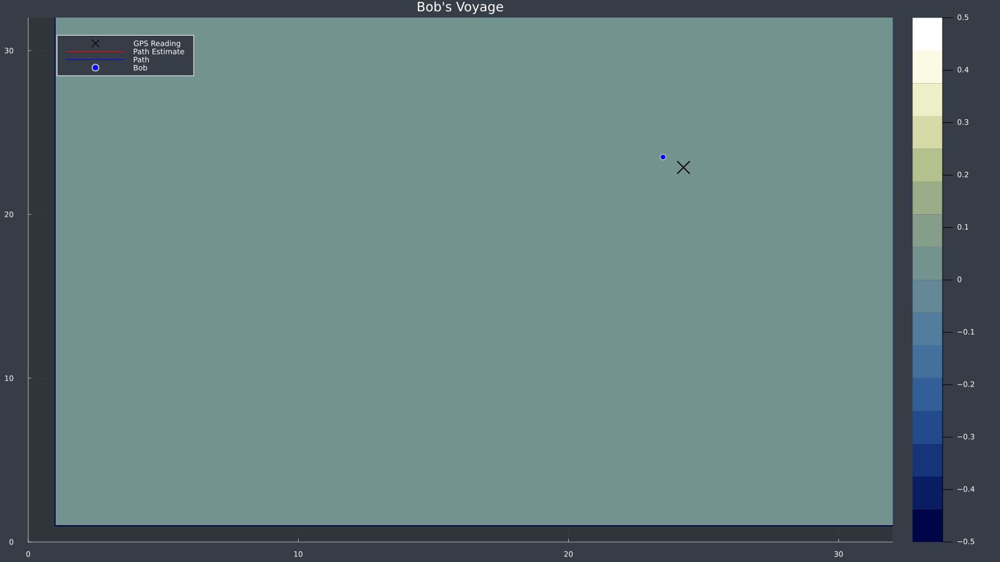

In [19]:
sim = makesim(XBOUND, YBOUND);
# intialize
t₀ = sim_time(sim)
duration = 10.0
tstep = 0.1

OBSV_EVERY = 3

let
Bob = [3*XBOUND/4; 3*YBOUND/4; -5; -5]
gps_reading = [XBOUND/2; YBOUND/2]
path = []
obsv_path = [[XBOUND/2; YBOUND/2]]
path_estimate = []
step = 0
sigma_y = 2
sigma_F = 25
# step and write
global anim = @animate for tᵢ in range(t₀,t₀+duration;step=tstep)
    # SIMULATION STEP
    sim_step!(sim,tᵢ,remeasure=true)
    Bobidxx = Int(trunc(Bob[1]/XBOUND)*size(sim.flow.p)[1])+1
    Bobidxy = Int(trunc(Bob[2]/YBOUND)*size(sim.flow.p)[2])+1
    gradpx = (sim.flow.p[mod(Bobidxx + 1, size(sim.flow.p)[1]), Bobidxy] - sim.flow.p[Bobidxx, Bobidxy])/2
    gradpy = (sim.flow.p[Bobidxx, mod(Bobidxy + 1, size(sim.flow.p)[1])] - sim.flow.p[Bobidxx, Bobidxy])/2
    Bobflowforce = 5*CuArray([gradpx; gradpy])
    Bobflowvel = CuArray(sim.flow.u[Bobidxx, Bobidxy, :])
    Bob = step_bob(Bob, Bobflowvel, Bobflowforce, sigma_F, tstep, mass=0.5) # BOB is forced along the pressure gradient and impacted by ambient velocity

    # OBSERVATION ONLY EVERY SEVERAL STEPS
    if step % OBSV_EVERY == 0
        gps_reading = observe(Bob, sigma_y)
        push!(obsv_path, gps_reading)
    end
    push!(path, Bob[1:2])
    # ESTIMATOR
    push!(path_estimate, mean(obsv_path[max(1,end-5):end]))

    #VISUALIZATION
    # @inside sim.flow.σ[I] = WaterLily.curl(3,I,sim.flow.u)*sim.L/sim.U
    # flood(sim.flow.σ,clims=(-10,10),shift=(-0.5,-0.5))
    # xgrid, ygrid = meshgrid(0:XBOUND, 0:YBOUND)
    # # quiver!(xgrid, ygrid, quiver = (sim.flow.u[:, :, 1]/2, sim.flow.u[:, :, 2]/2), color=:grey, label="velocity field")
    contourf(   sim.flow.p',
                size=(1600, 900),
                c=:davos, clims=(-0.5, 0.5),
                label="Pressure Field")

    scatter!([gps_reading[1]], [gps_reading[2]], title="Bob's Voyage", color=:black, markersize=10, markershape=:xcross, label="GPS Reading", xlim=(0, XBOUND), ylim=(0, YBOUND), legend=:topleft)
    plot!(stack(path_estimate)[1, :], stack(path_estimate)[2, :], color=:red, label="Path Estimate")
    plot!(stack(path)[1, :],stack(path)[2, :], color=:blue, label="Path")
    scatter!([Bob[1]], [Bob[2]], color=:blue, markersize=5, label="Bob")

    step += 1
end
end
gif(anim, fps=15)

## Not great, how can we improve our estimate? with Kalman Filtering!

## Introduction to Linear-Quadratic Estimation
I promise we'll get to the fluids part in a bit but before we need to figure out how to estimate Bob's position from our noisy GPS signal.

We seek the distribution $X|Y \thicksim N(?, ?)$

Because we assumed our system had randomness that was purely gaussian, we know our target distribution will also be Gaussian, and we can do Linear Algebra to figure it out exactly.

I'll spare you the complete derivation, but I'll give a sketch.

We know that $\mathbb{E}[X[n+1]]=A\mathbb{E}[X[n]]$

and $cov(X[n+1]) = Acov(X[n])A^T + \sigma_F \mathbb{I}_4$

In the space of Gaussians, an optimal estimator is always linear. So we will assume our estimate will look like our naive estimate based on our previous state, plus some gain times an error term for to correct our estimate via our observation. This gain is called the Kalman Gain

$\hat{x}[n] = \mathbb{E}[x[n]] + \mathcal{K} (y[n] - \mathbb{E}[y[n] | x[n]])$

$\mathcal{K}$ can be solved for using matrix calculus by setting the derivative of the $Tr(\mathcal{K})$ to zero. I won't go explain further but its a nice bit of math if you want to look it up.

The solution is

$
\mathcal{K} = PH^T(HPH^T + K_v)^{-1}
$
where $H$ is the observation matrix, $K_v$ is the observation noise covariance and $P$ is the predicted state error covariance

$P := cov(X[n+1])$

[ Info: Saved animation to c:\Users\TheoA\Documents\MIT\JUNJAUNT\18.354 Continuum Dynamics\final project\tmp.gif


Plots.AnimatedGif("c:\\Users\\TheoA\\Documents\\MIT\\JUNJAUNT\\18.354 Continuum Dynamics\\final project\\tmp.gif")
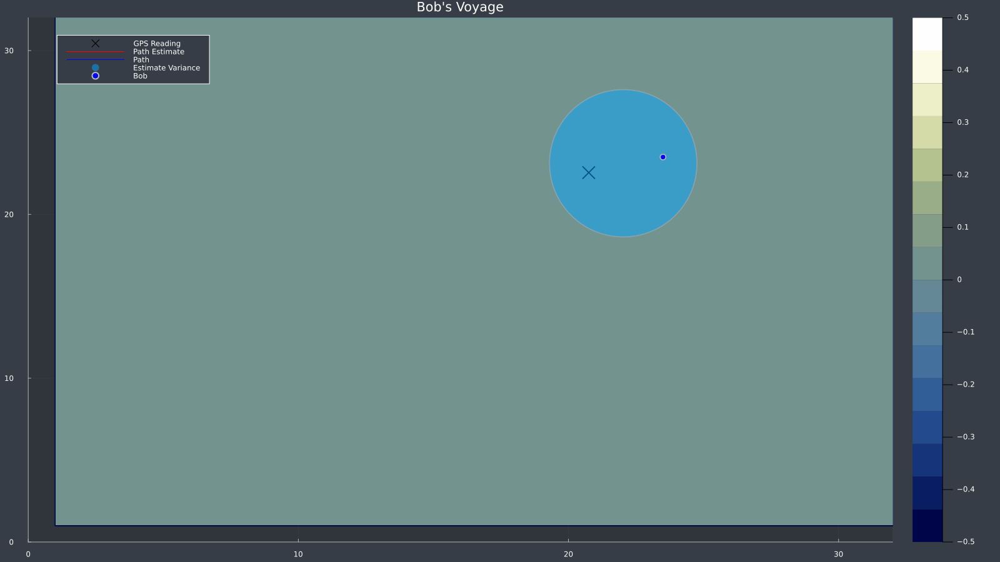

In [23]:
sim = makesim(XBOUND, YBOUND);
# intialize
t₀ = sim_time(sim)
duration = 10.0
tstep = 0.1

OBSV_EVERY = 3

let
Bob = [3*XBOUND/4; 3*YBOUND/4; -5; -5]
gps_reading = [3*XBOUND/4; 3*YBOUND/4]
path = []
obsv_path = [[3*XBOUND/4; 3*YBOUND/4]]
path_estimate = []
step = 0
# estimation variables
state_est = [3*XBOUND/4; 3*YBOUND/4; 0; 0]
state_pred = [3*XBOUND/4; 3*YBOUND/4; 0; 0]
cov_est = Matrix(I, 4, 4)
sigma_F = 25
sigma_y = 2
A = [1 0 tstep*OBSV_EVERY 0;
     0 1 0 tstep*OBSV_EVERY;
     0 0 DAMPING 0;
     0 0 0 DAMPING]
H = [1 0 0 0;
     0 1 0 0]

# step and write
global anim = @animate for tᵢ in range(t₀,t₀+duration;step=tstep)
    # SIMULATION STEP
    sim_step!(sim,tᵢ,remeasure=true)
    Bobidxx = Int(trunc(Bob[1]/XBOUND)*size(sim.flow.p)[1])+1
    Bobidxy = Int(trunc(Bob[2]/YBOUND)*size(sim.flow.p)[2])+1
    gradpx = (sim.flow.p[mod(Bobidxx + 1, size(sim.flow.p)[1]), Bobidxy] - sim.flow.p[Bobidxx, Bobidxy])/2
    gradpy = (sim.flow.p[Bobidxx, mod(Bobidxy + 1, size(sim.flow.p)[1])] - sim.flow.p[Bobidxx, Bobidxy])/2
    Bobflowforce = 5*CuArray([gradpx; gradpy])
    Bobflowvel = CuArray(sim.flow.u[Bobidxx, Bobidxy, :])
    Bob = step_bob(Bob, Bobflowvel, Bobflowforce, sigma_F, tstep, mass=5) # BOB is forced along the pressure gradient and impacted by ambient velocity


    # OBSERVATION
    if step % OBSV_EVERY == 0
        gps_reading = observe(Bob, sigma_y)
        push!(obsv_path, gps_reading)

        ## ESTIMATOR
        P = A*cov_est*A'+sigma_y*I
        G = P*H'*inv(H*P*H'+sigma_y*I)

        # print(cov_est)
        state_est = state_pred + G*(gps_reading - H*state_pred)
        cov_est = (I - G*H)*P*(I - G*H)' + G*sigma_y*G'

        state_pred = A*state_est
    end
    push!(path, Bob[1:2])

    push!(path_estimate, state_est)

    # VISUALIZATION
    # @inside sim.flow.σ[I] = WaterLily.curl(3,I,sim.flow.u)*sim.L/sim.U
    # flood(sim.flow.σ,clims=(-10,10),shift=(-0.5,-0.5))
    # xgrid, ygrid = meshgrid(0:XBOUND, 0:YBOUND)
    # quiver!(xgrid, ygrid, quiver = (sim.flow.u[:, :, 1]/2, sim.flow.u[:, :, 2]/2), color=:grey, label="velocity field")
    contourf(   sim.flow.p',
                size=(1600, 900),
                c=:davos, clims=(-0.5, 0.5),
                label="Pressure Field")

    scatter!([gps_reading[1]], [gps_reading[2]], title="Bob's Voyage", color=:black, markersize=10, markershape=:xcross, label="GPS Reading", xlim=(0, XBOUND), ylim=(0, YBOUND), legend=:topleft)
    plot!(stack(path_estimate)[1, :],stack(path_estimate)[2, :], color=:red, label="Path Estimate")
    plot!(stack(path)[1, :],stack(path)[2, :], color=:blue, label="Path")
    scatter!([state_est[1]], [state_est[2]], markersize=trunc(svdvals(cov_est)[1]*1600/XBOUND), label="Estimate Variance", opacity=0.5)
    scatter!([Bob[1]], [Bob[2]], color=:blue, markersize=5, label="Bob")

    step += 1
end
end
gif(anim, fps=15)

## Building an even better estimator by incorporating our knowledge of the velocity field

OK, so we know Bob is out there somewhere with some velocity and we can estimate his position from the GPS signal. But I think we can do better by incorporating our knowledge of fluid dynamics

[ Info: Saved animation to c:\Users\TheoA\Documents\MIT\JUNJAUNT\18.354 Continuum Dynamics\final project\tmp.gif


Plots.AnimatedGif("c:\\Users\\TheoA\\Documents\\MIT\\JUNJAUNT\\18.354 Continuum Dynamics\\final project\\tmp.gif")
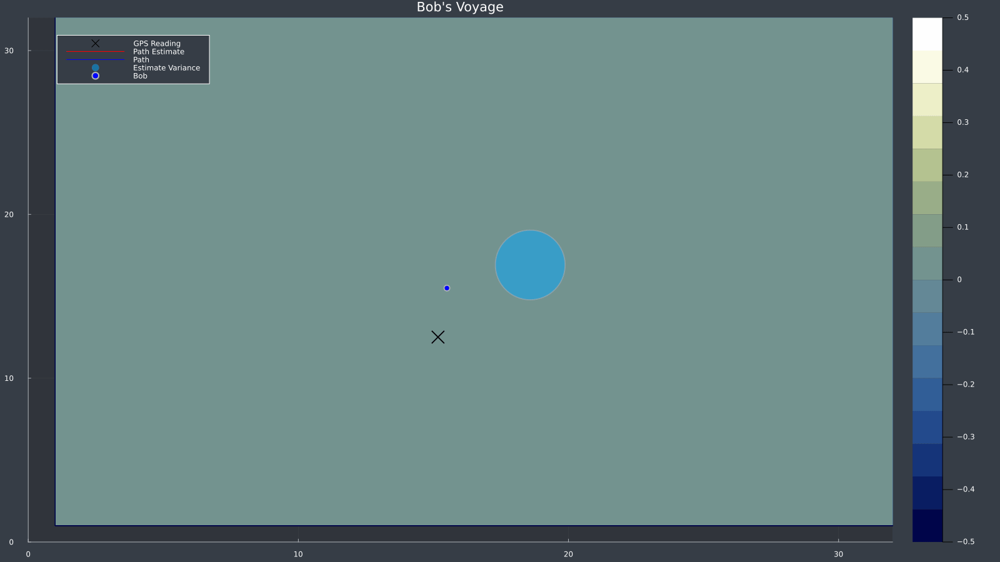

In [24]:
sim = makesim(XBOUND, YBOUND);
# intialize
t₀ = sim_time(sim)
duration = 5.0
tstep = 0.1

OBSV_EVERY = 3

let
Bob = [XBOUND/2; YBOUND/2; -5; -5]
gps_reading = [XBOUND/2; YBOUND/2]
path = []
obsv_path = [[XBOUND/2; YBOUND/2]]
path_estimate = []
step = 0

# estimation variables
state_est = [3*XBOUND/4; 3*YBOUND/4; 0; 0]
state_pred = [3*XBOUND/4; 3*YBOUND/4; 0; 0]
cov_est = Matrix(I, 4, 4)
sigma_F = 25
sigma_y = 2
A = [1 0 OBSV_EVERY*tstep 0;
     0 1 0 OBSV_EVERY*tstep;
     0 0 1 0;
     0 0 0 1]
H = [1 0 0 0;
     0 1 0 0;
     0 0 1 0;
     0 0 0 1]

# step and write
global anim = @animate for tᵢ in range(t₀,t₀+duration;step=tstep)
    # SIMULATION STEP
    sim_step!(sim,tᵢ,remeasure=true)
    Bobidxx = Int(trunc(Bob[1]/XBOUND)*size(sim.flow.p)[1])+1
    Bobidxy = Int(trunc(Bob[2]/YBOUND)*size(sim.flow.p)[2])+1
    gradpx = (sim.flow.p[mod(Bobidxx + 1, size(sim.flow.p)[1]), Bobidxy] - sim.flow.p[Bobidxx, Bobidxy])/2
    gradpy = (sim.flow.p[Bobidxx, mod(Bobidxy + 1, size(sim.flow.p)[1])] - sim.flow.p[Bobidxx, Bobidxy])/2
    Bobflowforce = 5*CuArray([gradpx; gradpy])
    Bobflowvel = CuArray(sim.flow.u[Bobidxx, Bobidxy, :])
    Bob = step_bob(Bob, Bobflowvel, Bobflowforce, sigma_F, tstep, mass=0.5) # BOB is forced along the pressure gradient and impacted by ambient velocity


    # OBSERVATION
    if step % OBSV_EVERY == 0
        gps_reading = observe(Bob, sigma_y)
        flowvel_reading = CuArray(sim.flow.u[Bobidxx, Bobidxy, :]) + CUDA.randn(2, 1)*sigma_y
        push!(obsv_path, gps_reading)

        ## ESTIMATOR
        P = A*cov_est*A'+sigma_y*I
        G = P*H'*inv(H*P*H'+sigma_y*I)

        # print(cov_est)
        state_est = state_pred + G*([gps_reading; flowvel_reading] - state_pred)
        cov_est = (I - G*H)*P*(I - G*H)' + G*sigma_y*G'

        state_pred = A*state_est

    end
    push!(path, Bob[1:2])

    push!(path_estimate, state_est[1:2])

    # VISUALIZATION
    contourf(   sim.flow.p',
                size=(1600, 900),
                c=:davos, clims=(-0.5, 0.5),
                label="Pressure Field")

    scatter!([gps_reading[1]], [gps_reading[2]], title="Bob's Voyage", color=:black, markersize=10, markershape=:xcross, label="GPS Reading", xlim=(0, XBOUND), ylim=(0, YBOUND), legend=:topleft)
    plot!(stack(path_estimate)[1, :],stack(path_estimate)[2, :], color=:red, label="Path Estimate")
    plot!(stack(path)[1, :],stack(path)[2, :], color=:blue, label="Path")
    scatter!([state_est[1]], [state_est[2]], markersize=trunc(svdvals(cov_est)[1]*1600/XBOUND), label="Estimate Variance", opacity=0.5)
    scatter!([Bob[1]], [Bob[2]], color=:blue, markersize=5, label="Bob")

    step += 1
end
end
gif(anim, fps=15)